In [1]:
!pip3 install numpy | grep -v 'already satisfied'
!pip3 install pandas | grep -v 'already satisfied'
!pip3 install seaborn | grep -v 'already satisfied'
!pip3 install scanpy | grep -v 'already satisfied'

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.2 anndata==0.8.0 umap==0.5.3 numpy==1.22.0 scipy==1.10.0 pandas==1.5.3 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [7]:
import os

# path
path = "/Volumes/Extreme_SSD/snRNA/"

# for each folder in path make an adata object with a unique name with read_10x_mtx
folders = os.listdir(path)

data=[]
for folder in folders:
    adata = sc.read_10x_mtx(path+folder, var_names='gene_symbols', cache=True, prefix=folder+'_')
    data.append([folder,
                  adata])

... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119522_SF10127-GSM4119522_SF10127_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119523_SF11979sn-GSM4119523_SF11979sn_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119524_SF12090-GSM4119524_SF12090_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119525_SF12264-GSM4119525_SF12264_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119526_SF4400-GSM4119526_SF4400_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119527_SF4297-GSM4119527_SF4297_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119528_SF6996-GSM4119528_SF6996_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119529_SF9259R-GSM4119529_SF9259R_matrix.h5ad
... reading from cache file cache/Volumes-Extreme_SSD-snRNA-GSM4119530_SF9259S-GSM4119530_SF9259S_matrix.h5ad
... reading 

In [121]:
adata_us_combined = sc.read_h5ad('write/human_combined_2.h5ad')
adata_total_combined = sc.read_h5ad('write/total_combined.h5ad')


In [122]:
adata_total_combined.obs

,batch
AAACCCAAGACATCCT-1-1914_human-1914,1914
AAACCCAAGCATGAAT-1-1914_human-1914,1914
AAACCCAAGCTAGATA-1-1914_human-1914,1914
AAACCCAAGTCCTGCG-1-1914_human-1914,1914
AAACCCACAAAGGAGA-1-1914_human-1914,1914
...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919,1919
TTTGTTGGTGTAGTGG-1-1919d_rat-1919,1919
TTTGTTGTCCATACTT-1-1919d_rat-1919,1919
TTTGTTGTCCCAAGCG-1-1919d_rat-1919,1919


In [123]:
sc.pp.neighbors(adata_total_combined, n_neighbors=10, n_pcs=40)


computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:06)


In [124]:
sc.tl.louvain(adata_total_combined, resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 60 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:12)


In [125]:
adata_total_combined.obs['sample_type'] = adata_total_combined.obs.index.str.split('-1-').str[1]
adata_total_combined.obs


,batch,louvain,sample_type
AAACCCAAGACATCCT-1-1914_human-1914,1914,0,1914_human-1914
AAACCCAAGCATGAAT-1-1914_human-1914,1914,0,1914_human-1914
AAACCCAAGCTAGATA-1-1914_human-1914,1914,0,1914_human-1914
AAACCCAAGTCCTGCG-1-1914_human-1914,1914,0,1914_human-1914
AAACCCACAAAGGAGA-1-1914_human-1914,1914,7,1914_human-1914
...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919,1919,35,1919d_rat-1919
TTTGTTGGTGTAGTGG-1-1919d_rat-1919,1919,16,1919d_rat-1919
TTTGTTGTCCATACTT-1-1919d_rat-1919,1919,18,1919d_rat-1919
TTTGTTGTCCCAAGCG-1-1919d_rat-1919,1919,24,1919d_rat-1919


In [126]:
# how many leiden clusters are there?
adata_total_combined.obs['louvain'].value_counts()

0     8342
1     7653
2     5132
3     3107
4     3093
5     2805
6     2267
7     2186
8     2026
9     1465
10    1343
11    1223
12    1208
13    1161
14    1125
15    1100
16    1025
17     996
18     982
19     888
20     807
21     752
22     698
23     682
24     661
25     620
26     608
27     604
28     596
29     589
30     586
31     580
32     543
33     537
34     530
35     519
36     507
37     491
38     489
39     486
40     470
41     468
42     446
43     440
44     435
45     423
46     420
47     321
48     305
49     281
50     269
51     238
52     217
53     217
54     155
55     153
56     112
57     108
58      83
59      79
Name: louvain, dtype: int64

In [128]:
sc.tl.umap(adata_total_combined, min_dist=0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:32)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


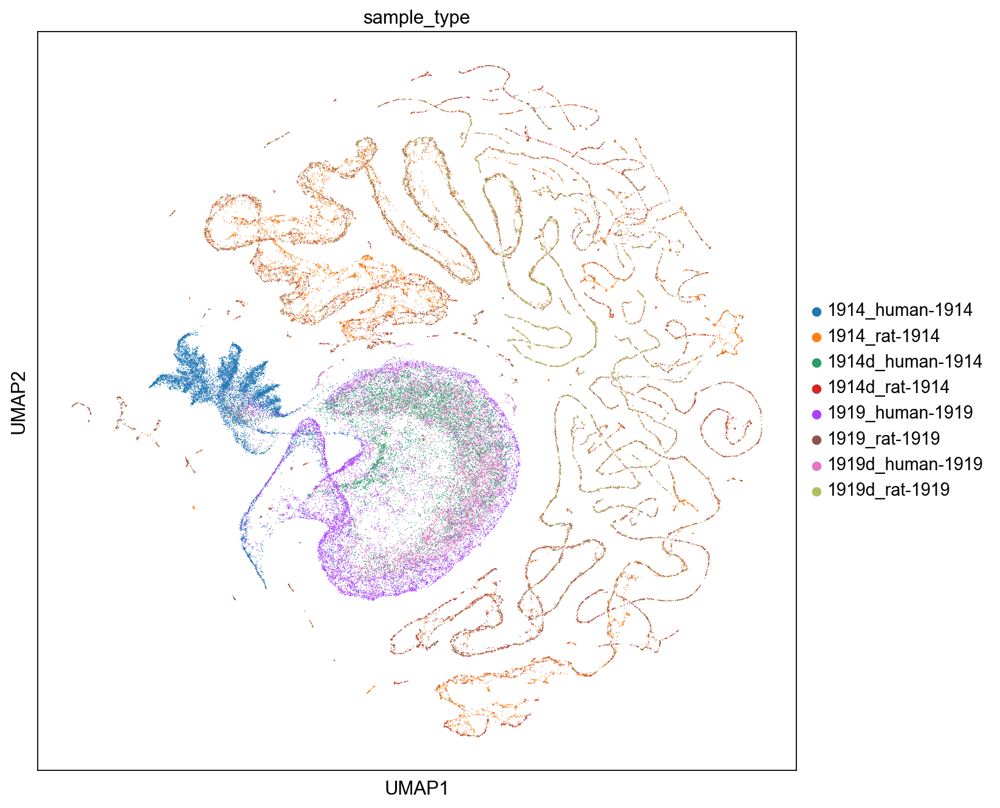

In [129]:
sc.pl.umap(adata_total_combined, color=['sample_type'])

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:12)
the obs value 'louvain' has more than 103 categories. Uniform 'grey' color will be used for all categories.
--> added 'pos', the PAGA positions (adata.uns['paga'])


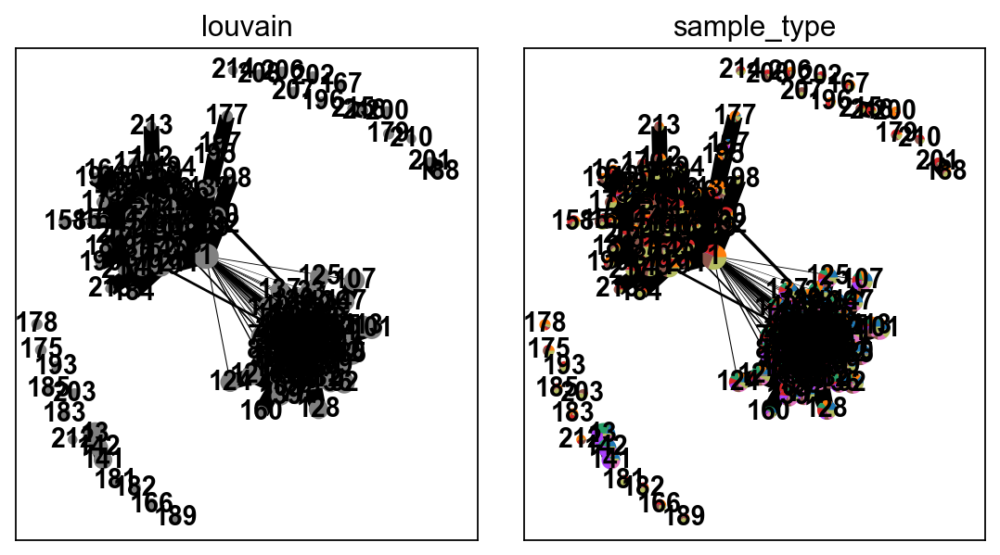

In [66]:
sc.tl.paga(adata_total_combined, groups='louvain')
sc.pl.paga(adata_total_combined, color=['louvain', 'sample_type'])

In [68]:
sc.tl.draw_graph(adata, init_pos='paga')
sc.pl.draw_graph(adata, color=['louvain', 'sample_type'])

drawing single-cell graph using layout 'fa'


KeyError: 'No "neighbors" in .uns'

In [69]:
# annotate with provide cell types from .txt file
cell_types = pd.read_csv('SF1/GSE138794_snRNA_Seq_cell_types.txt', sep=' ', header=None, index_col=0)

In [70]:
sample_identifiers = [
    "SF10022",
    "SF10127",
    "SF11979",
    "SF12090",
    "SF12264",
    "SF4400",
    "SF4297",
    "SF6996",
    "SF9259R",
    "SF9259S"
]

data2=[]
cell_t = cell_types

for identifier in sample_identifiers:
    # get the adata object in data where sample identifier is in the name of the adata object [0]
    adata = [x for x in data if identifier in x[0]][0][1]
    print(adata)
    cell_t = cell_types
    print(identifier)
    # remove all cell types that don't begin with the sample identifier
    print(cell_types.index.str.startswith(identifier).sum())

    cell_t = cell_t[cell_t.index.str.startswith(identifier)]
    # print(cell_t)
    # remove the sample identifier from the cell type
    cell_t.index = cell_t.index.str.replace(identifier + '_', '')
    # add the cell types to the adata object
    # print(cell_t)
    print(len(cell_t), len(adata))

    # # add the cell types to the adata[i].obs dataframe where index matches obs
    try:
        adata.obs['cell_type'] = cell_t.loc[adata.obs.index, 1]
        # print(adata.obs)
        data2.append([identifier, adata])
    except:
        print('error')
        pass

AnnData object with n_obs × n_vars = 2888 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF10022
2888
2888 2888
AnnData object with n_obs × n_vars = 975 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF10127
975
975 975
AnnData object with n_obs × n_vars = 693 × 33694
    var: 'gene_ids', 'feature_types'
SF11979
693
693 693
error
AnnData object with n_obs × n_vars = 107 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF12090
107
107 107
AnnData object with n_obs × n_vars = 2324 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF12264
2324
2324 2324
AnnData object with n_obs × n_vars = 489 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF4400
489
489 489
AnnData object with n_obs × n_vars = 3901 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF4297
3901
3901 3901
AnnData object with n_obs × n_vars = 2669 × 33694
    obs: 'cell_type'
    var: 'gene_ids', 'feature_types'
SF6996
2

In [71]:
# combine all adata objects into one adata object with concatenate
adata_ref_combined = sc.AnnData.concatenate(*[x[1] for x in data2], batch_categories=[x[0] for x in data2])

/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next 

In [72]:
sc.pp.pca(adata_ref_combined)
sc.pp.neighbors(adata_ref_combined)
sc.tl.umap(adata_ref_combined)

computing PCA
    with n_comps=50
    finished (0:00:56)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [73]:
sc.tl.louvain(adata_ref_combined, resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)


In [74]:
adata_ref_combined.obs

,cell_type,batch,louvain
AAACCCAAGAAGGTAG-1-SF10022,Neoplastic_cell/proneural,SF10022,1
AAACCCAAGACCTCCG-1-SF10022,Neoplastic_cell/proneural,SF10022,1
AAACCCACAACTTGGT-1-SF10022,Neoplastic_cell/proneural,SF10022,1
AAACCCAGTCTACGAT-1-SF10022,Oligodendrocyte,SF10022,2
AAACCCAGTTATCTTC-1-SF10022,Neoplastic_cell/mesenchymal,SF10022,1
...,...,...,...
TTTCCTCTCCCTTGGT-1-SF9259S,Oligodendrocyte,SF9259S,2
TTTGGAGTCAACACCA-1-SF9259S,Oligodendrocyte,SF9259S,2
TTTGGTTGTCGTTATG-1-SF9259S,Oligodendrocyte,SF9259S,2
TTTGTTGAGCTCTTCC-1-SF9259S,Oligodendrocyte,SF9259S,2


In [14]:
adata_ref_combined.write('write/ref_snseq.h5ad')

/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


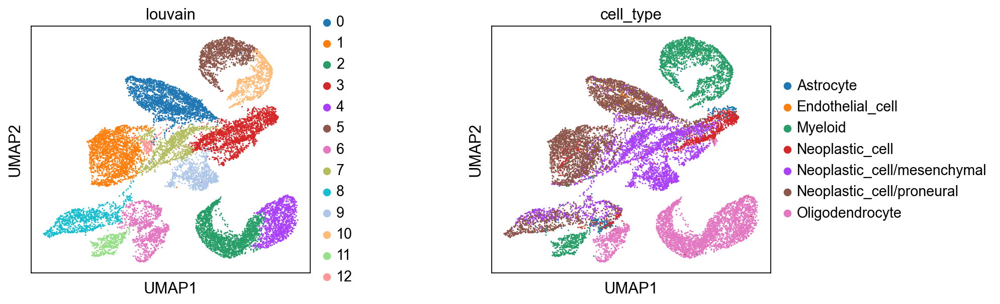

In [76]:
sc.pl.umap(adata_ref_combined, color=['louvain', 'cell_type'], wspace=0.5)


In [130]:
var_names = adata_ref_combined.var_names.intersection(adata_total_combined.var_names)
adata_ref = adata_ref_combined[:, var_names]
adata_total = adata_total_combined[:, var_names]

In [134]:
adata_total.obs['clusters'] = adata_total.obs['louvain']
adata_total.obs


,batch,louvain,sample_type,clusters
AAACCCAAGACATCCT-1-1914_human-1914,1914,0,1914_human-1914,0
AAACCCAAGCATGAAT-1-1914_human-1914,1914,0,1914_human-1914,0
AAACCCAAGCTAGATA-1-1914_human-1914,1914,0,1914_human-1914,0
AAACCCAAGTCCTGCG-1-1914_human-1914,1914,0,1914_human-1914,0
AAACCCACAAAGGAGA-1-1914_human-1914,1914,7,1914_human-1914,7
...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919,1919,35,1919d_rat-1919,35
TTTGTTGGTGTAGTGG-1-1919d_rat-1919,1919,16,1919d_rat-1919,16
TTTGTTGTCCATACTT-1-1919d_rat-1919,1919,18,1919d_rat-1919,18
TTTGTTGTCCCAAGCG-1-1919d_rat-1919,1919,24,1919d_rat-1919,24


In [135]:
sc.tl.ingest(adata_total, adata_ref, obs='louvain')


running ingest
    finished (0:04:19)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


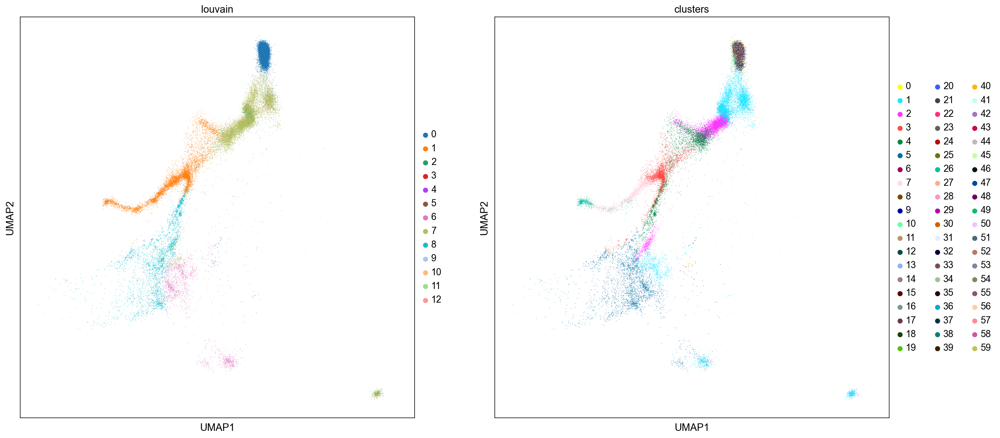

In [137]:
# adata_combined.uns['louvain_colors'] = adata_ref.uns['louvain_colors']  # fix colors
sc.pl.umap(adata_total, color=['louvain', 'clusters'])


In [51]:
# make new category obs based on index name after -1-
adata_total.obs['sample_type'] = adata_total.obs.index.str.split('-1-').str[1]


In [105]:
!pip3 install bbknn

In [139]:
adata_concat = adata_ref.concatenate(adata_total, batch_categories=['ref', 'new'])


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [140]:
# sc.external.pp.bbknn(adata_concat, batch_key='batch')

In [142]:
adata_concat.obs.louvain = adata_concat.obs.louvain.astype('category')
adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering
adata_concat.uns['louvain_colors'] = adata_ref.uns['louvain_colors']  # fix category colors


/var/folders/tg/d35b8qxd2dsb9362y56zzdg80000gn/T/ipykernel_87513/1178553373.py:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


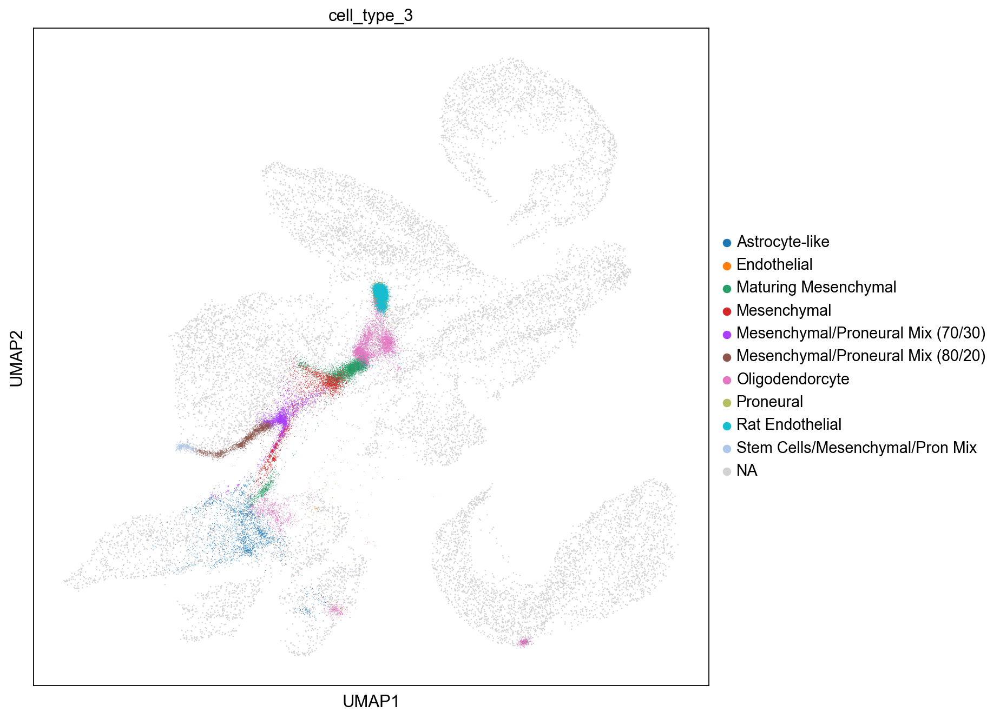

In [242]:
# provide space between the graphs:

# make the image bigger
sc.set_figure_params(dpi=80, facecolor='white', figsize=(10, 10))

# color only up to cluster 16 in column 'clusters'


# set size column that everything that has cell_type is 10 and everything else is 1
adata_concat.obs['size'] = 1
adata_concat.obs.loc[adata_concat.obs['cell_type'].notnull(), 'size'] = 5

sc.pl.umap(adata_concat, color=['cell_type_3'], wspace=0.5, size=adata_concat.obs['size'])
# only show from batch new
# adata_new = adata_concat[adata_concat.obs['batch'] == 'new']
# sc.pl.umap(adata_new, color=['leiden'] , wspace=0.5)



,cell_type,batch,louvain,sample_type,clusters,size,cluster_big
AAACCCAAGAAGGTAG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,1,False
AAACCCAAGACCTCCG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,1,False
AAACCCACAACTTGGT-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,1,False
AAACCCAGTCTACGAT-1-SF10022-ref,Oligodendrocyte,ref,2,NaN,NaN,1,False
AAACCCAGTTATCTTC-1-SF10022-ref,Neoplastic_cell/mesenchymal,ref,1,NaN,NaN,1,False
...,...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,35,10,False
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,16,20,False
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,18,10,False
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,24,10,False


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


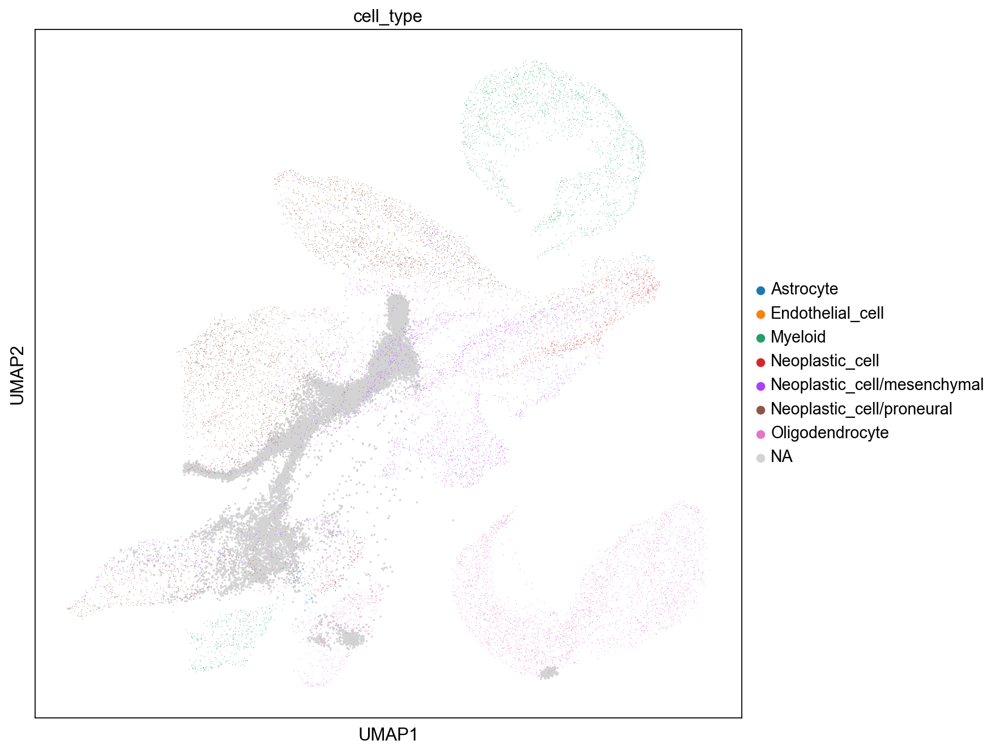

In [157]:
# make the dots of of everything with 'cell_type' category that is not NA bigger
adata_concat.obs['size'] = 10
adata_concat.obs.loc[adata_concat.obs['cell_type'].notna(), 'size'] = 1

sc.pl.umap(adata_concat, color=['cell_type'], wspace=0.5, size=adata_concat.obs['size'])



In [153]:
adata_concat.obs

,cell_type,batch,louvain,sample_type,clusters,size
AAACCCAAGAAGGTAG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,10
AAACCCAAGACCTCCG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,10
AAACCCACAACTTGGT-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,10
AAACCCAGTCTACGAT-1-SF10022-ref,Oligodendrocyte,ref,2,NaN,NaN,10
AAACCCAGTTATCTTC-1-SF10022-ref,Neoplastic_cell/mesenchymal,ref,1,NaN,NaN,10
...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,35,1
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,16,1
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,18,1
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,24,1


In [162]:
# count the number of cells in each cluster
adata_concat.obs['clusters'].value_counts()

# how many have above  

0     8342
1     7653
2     5132
3     3107
4     3093
5     2805
6     2267
7     2186
8     2026
9     1465
10    1343
11    1223
12    1208
13    1161
14    1125
15    1100
16    1025
17     996
18     982
19     888
20     807
21     752
22     698
23     682
24     661
25     620
26     608
27     604
28     596
29     589
30     586
31     580
32     543
33     537
34     530
35     519
36     507
37     491
38     489
39     486
40     470
41     468
42     446
43     440
44     435
45     423
46     420
47     321
48     305
49     281
50     269
51     238
52     217
53     217
54     155
55     153
56     112
57     108
58      83
59      79
Name: clusters, dtype: int64

In [228]:
# renormalize and log and neighbours umap adata_new


adata_new = adata_concat[adata_concat.obs['batch'] == 'new']

sc.tl.pca(adata_new, svd_solver='arpack')
sc.pp.neighbors(adata_new, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_new)
sc.tl.leiden(adata_new, resolution=0.5)


computing PCA
    with n_comps=50
    finished (0:00:42)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:42)
running Leiden clustering
    finished: found 37 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:10)


In [229]:

# call all na values in cell_type_3 'rat_endothelial'
adata_new.obs['cell_type_3'] = adata_new.obs['cell_type_3'].fillna('rat_endothelial')


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


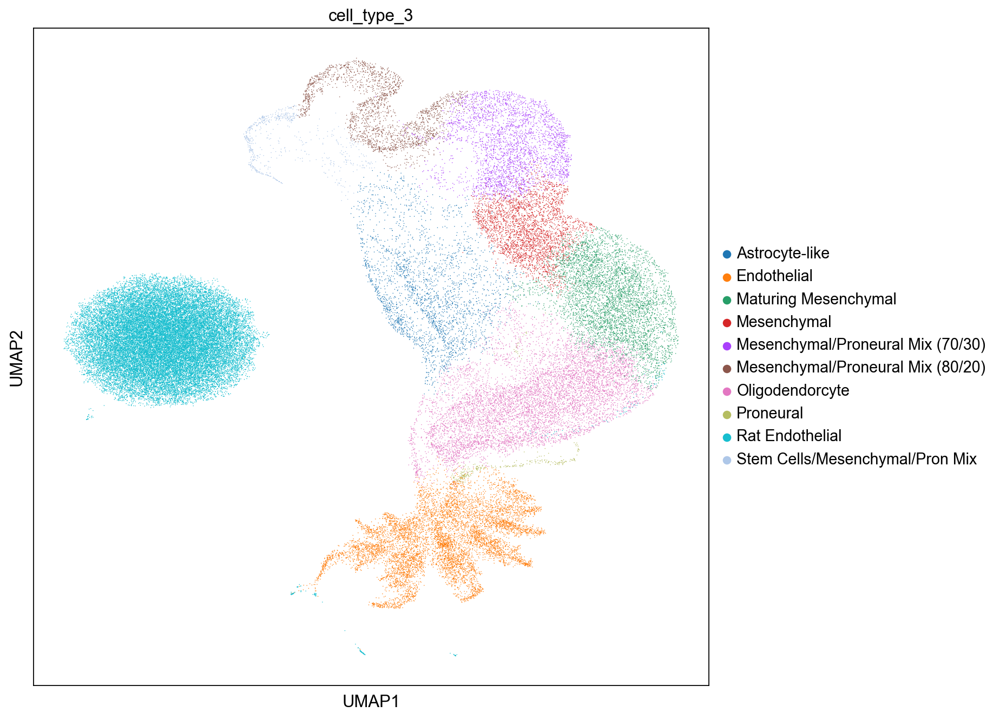

In [230]:
sc.pl.umap(adata_new, color="cell_type_3")


In [ ]:
# sc.pl.umap(adata_new, color=['sample_type'], wspace=0.5)
# sc.pp.calculate_qc_metrics(adata_new, inplace=True)
# sc.pp.regress_out(adata_new, ['n_counts', 'percent_mito'])

# sc.pp.scale(adata_new, max_value=10)
# sc.tl.pca(adata_new, svd_solver='arpack')
# sc.pp.neighbors(adata_new, n_neighbors=10, n_pcs=40)
# sc.tl.umap(adata_new)
# sc.tl.leiden(adata_new, resolution=0.5)



,cell_type,batch,louvain,sample_type,cell_type_2,leiden
AAACCCAAGACATCCT-1-1914_human-1914-new,NaN,new,0,1914_human-1914,Endothelial,2
AAACCCAAGCATGAAT-1-1914_human-1914-new,NaN,new,0,1914_human-1914,Endothelial,2
AAACCCAAGCTAGATA-1-1914_human-1914-new,NaN,new,0,1914_human-1914,Endothelial,2
AAACCCAAGTCCTGCG-1-1914_human-1914-new,NaN,new,0,1914_human-1914,Endothelial,2
AAACCCACAAAGGAGA-1-1914_human-1914-new,NaN,new,1,1914_human-1914,Stem Cells (Mesenchymal),1
...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial,0
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial,0
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial,0
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial,0


0


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


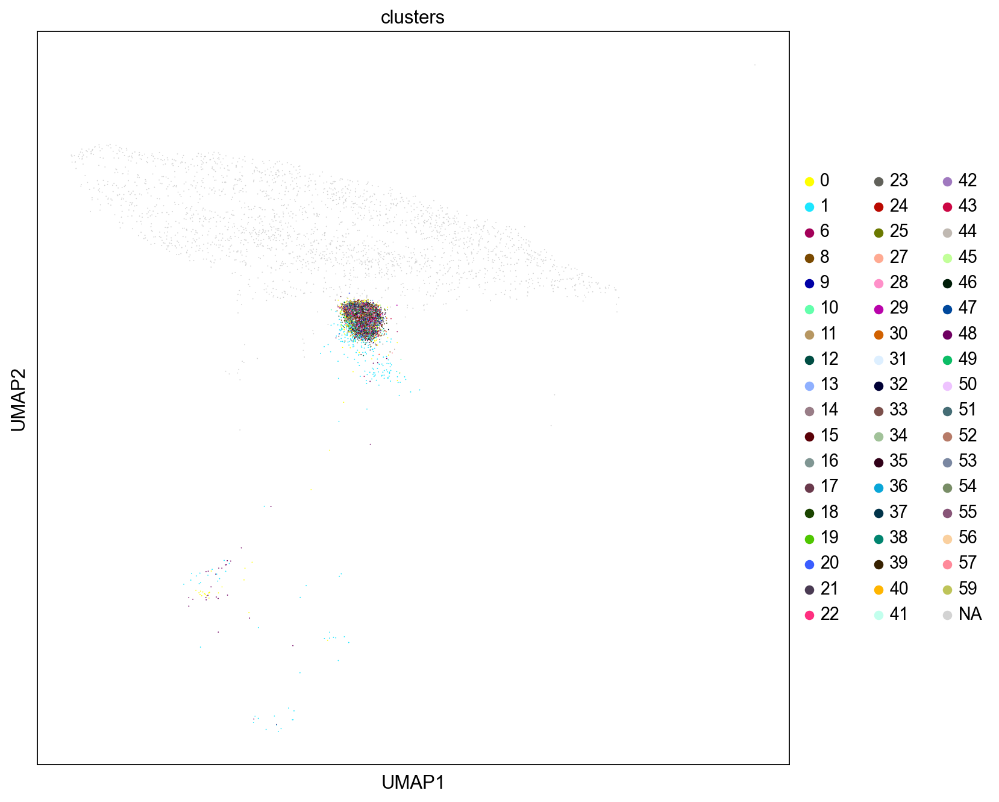

1


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


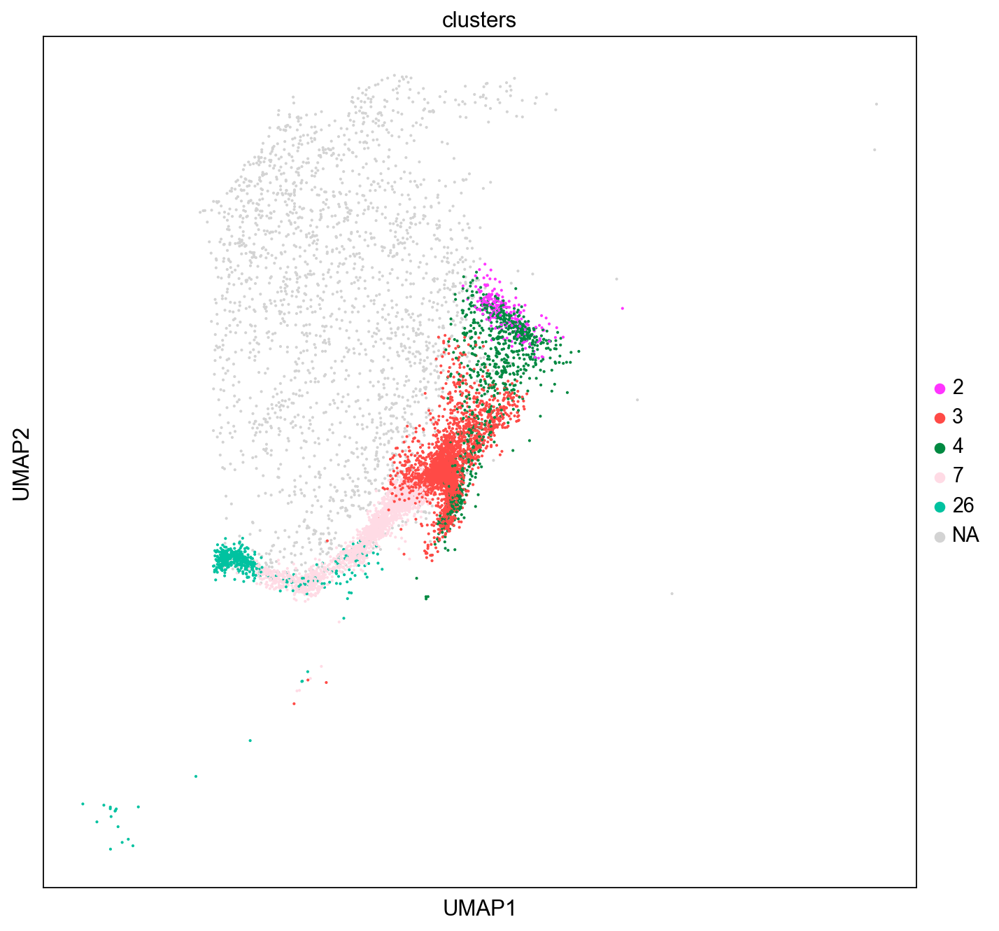

2


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


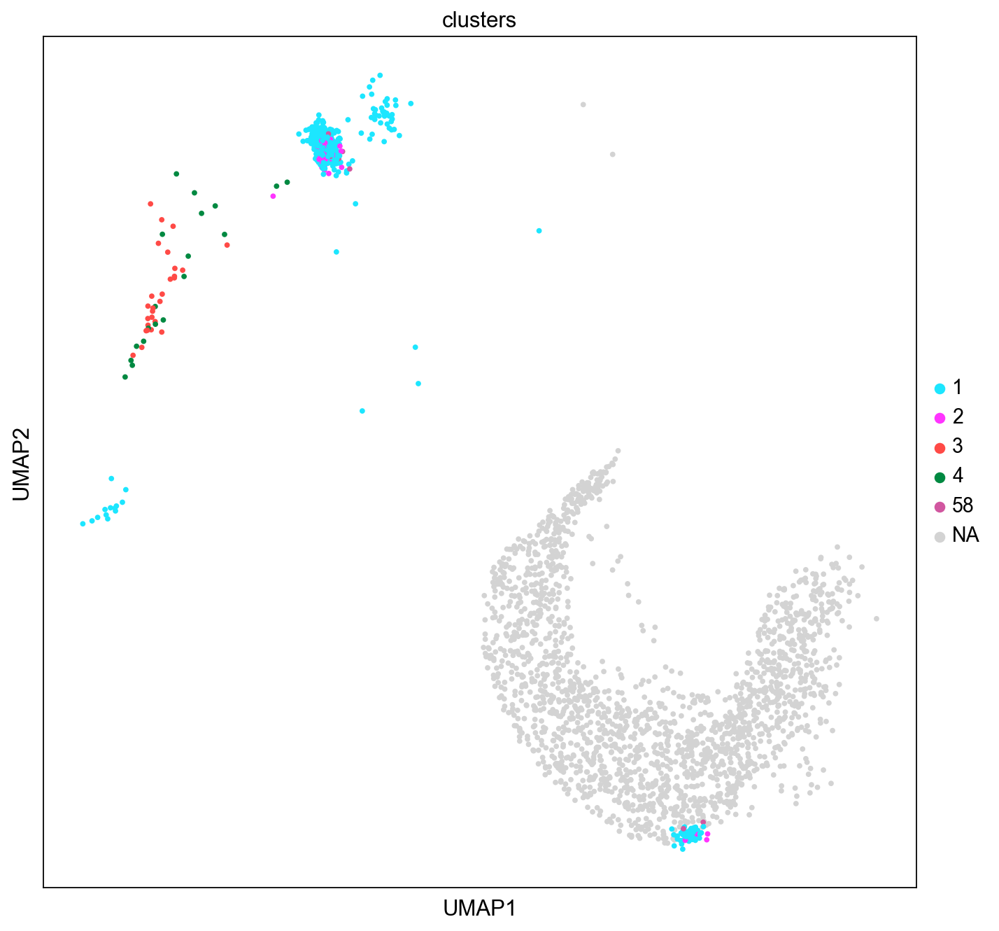

3


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


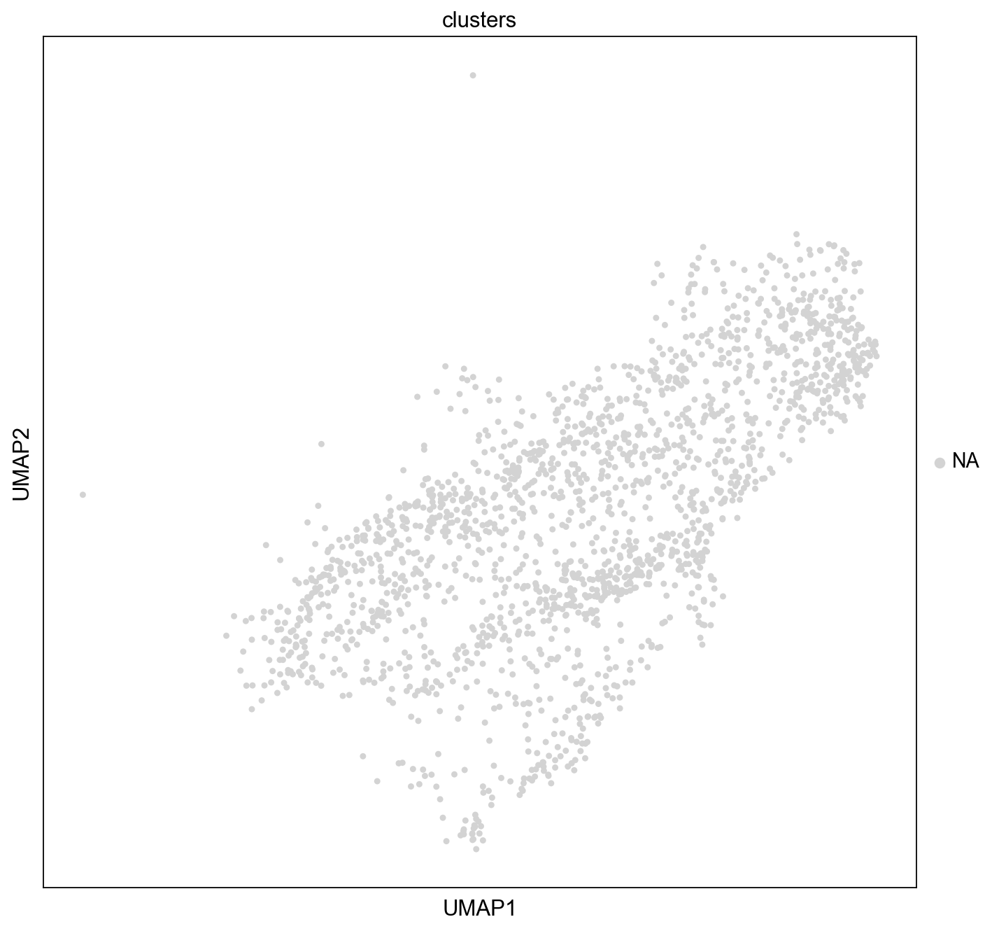

4


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


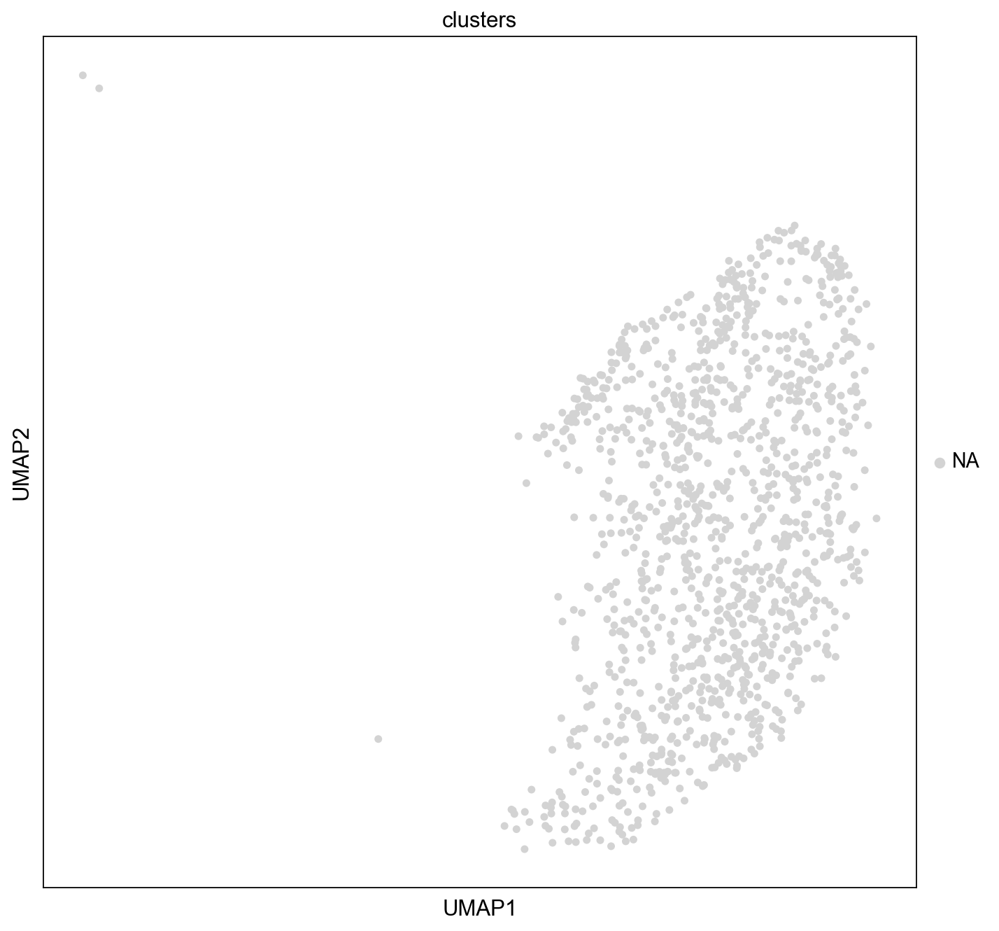

5


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


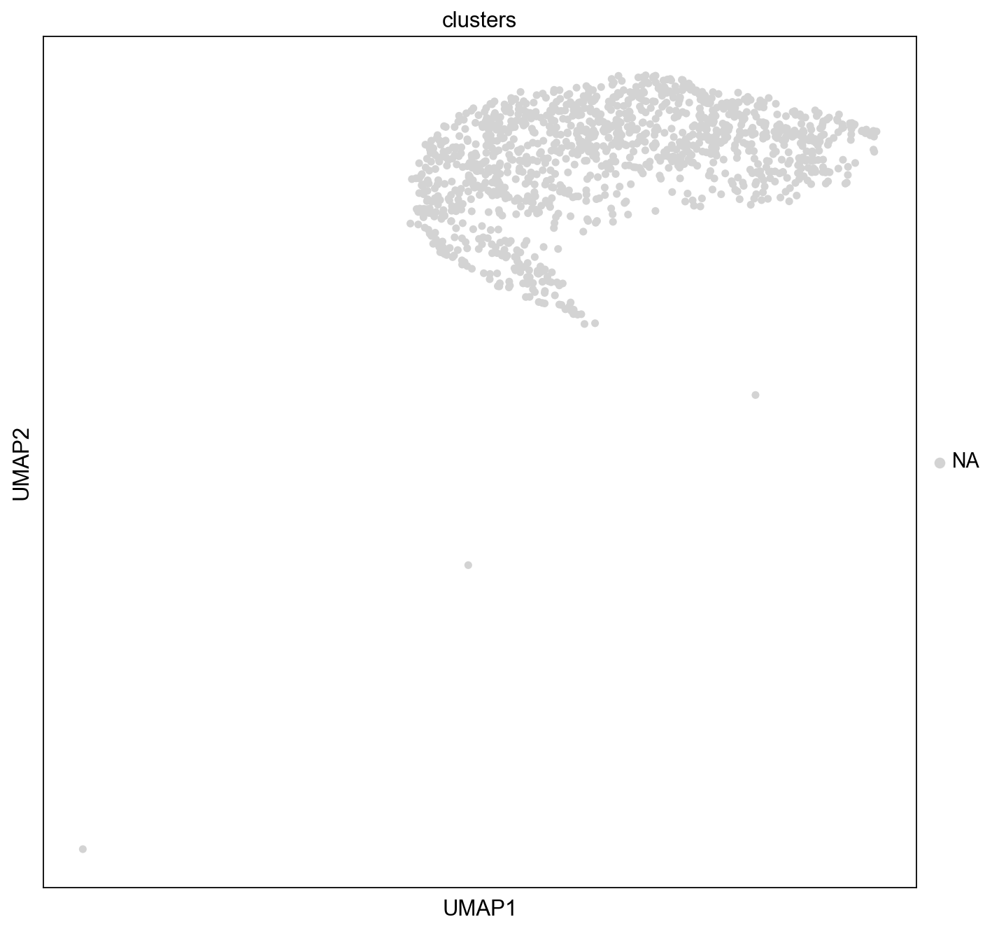

6


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


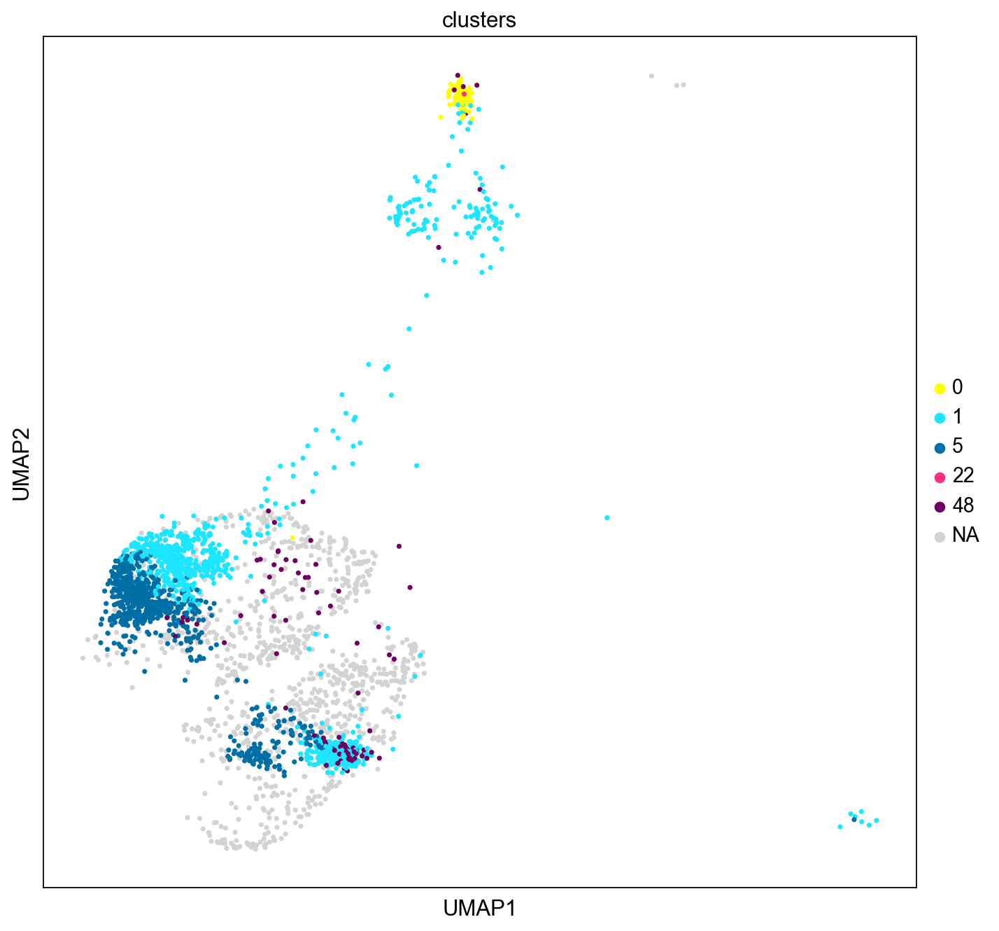

7


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


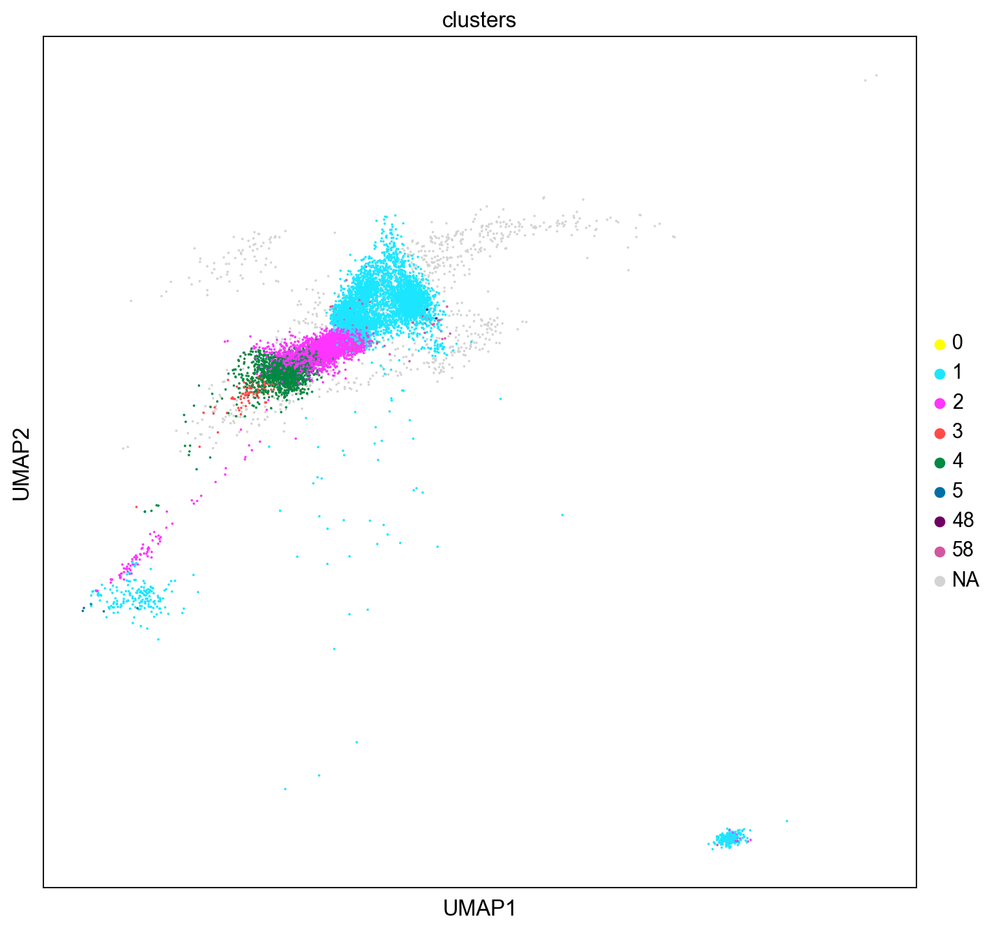

8


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


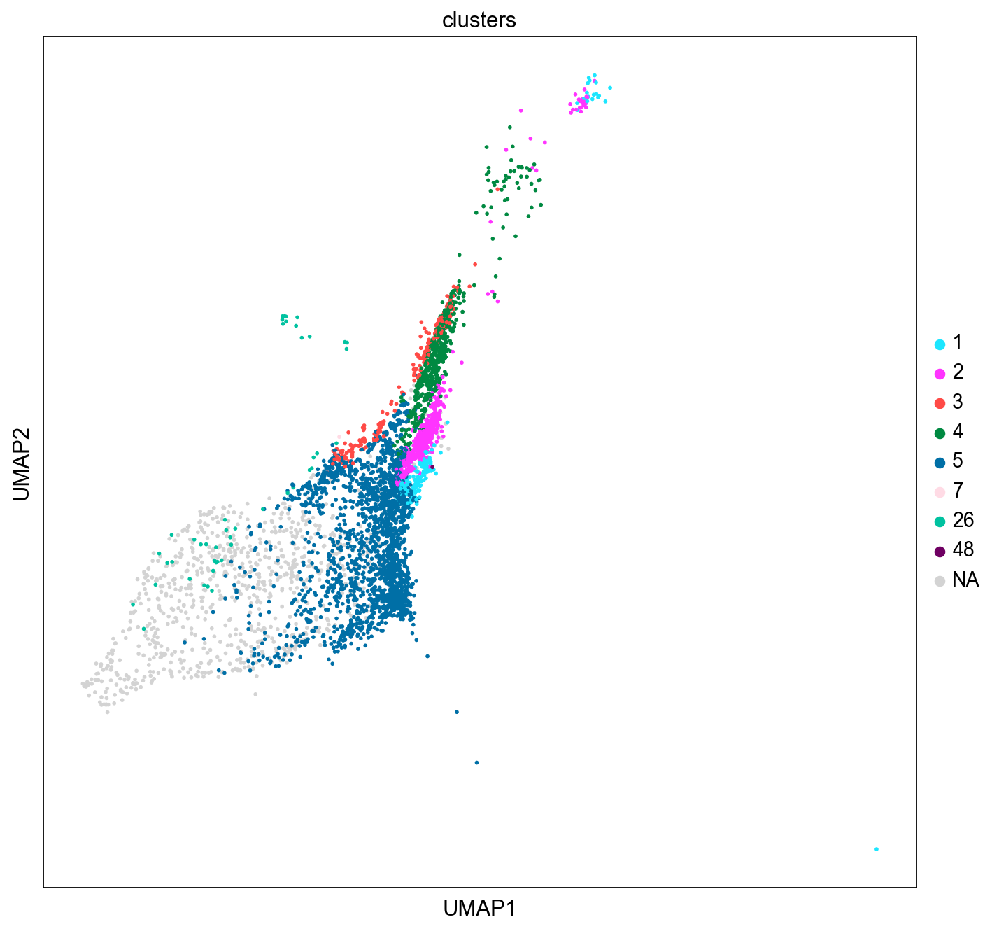

9


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


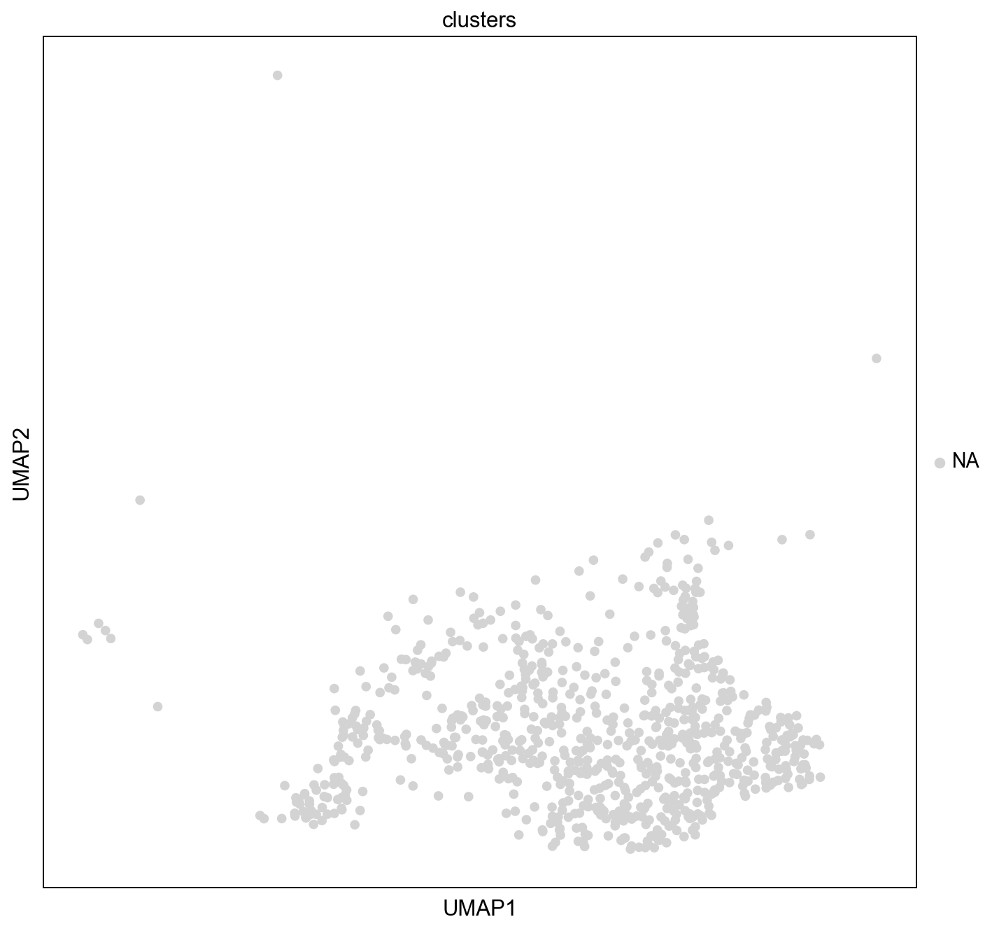

10


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


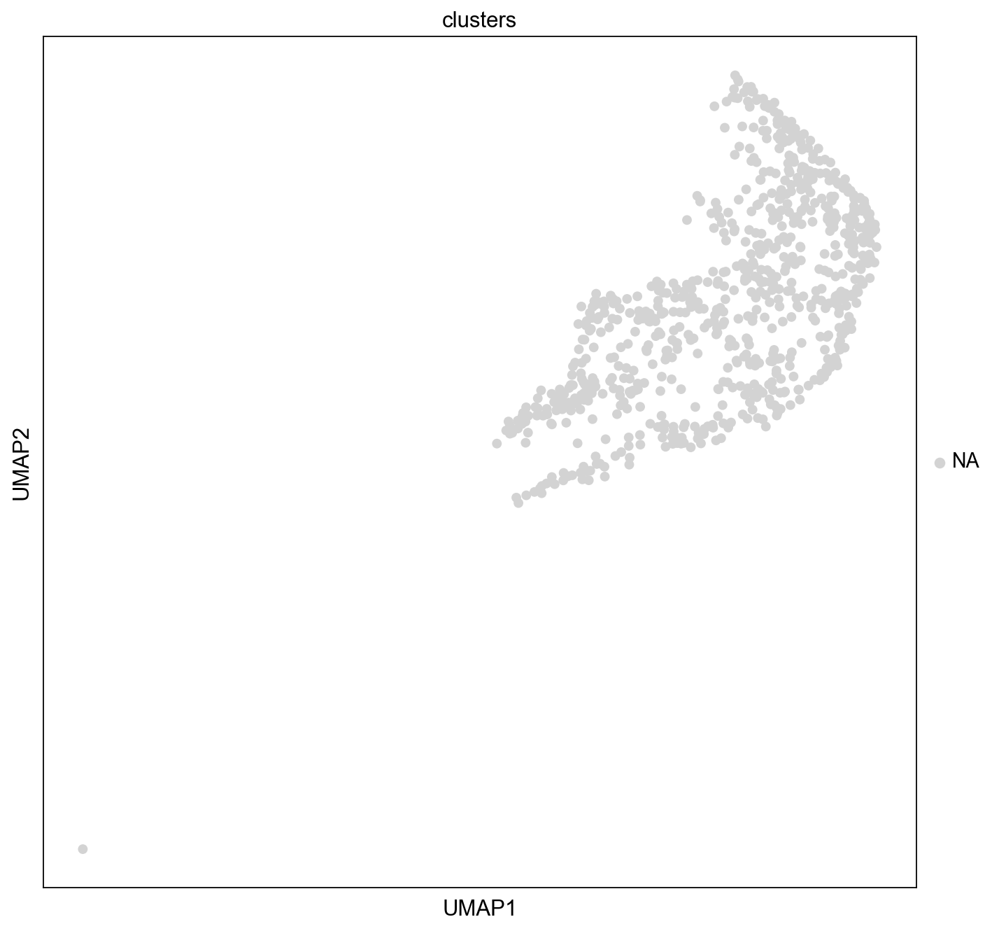

11


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


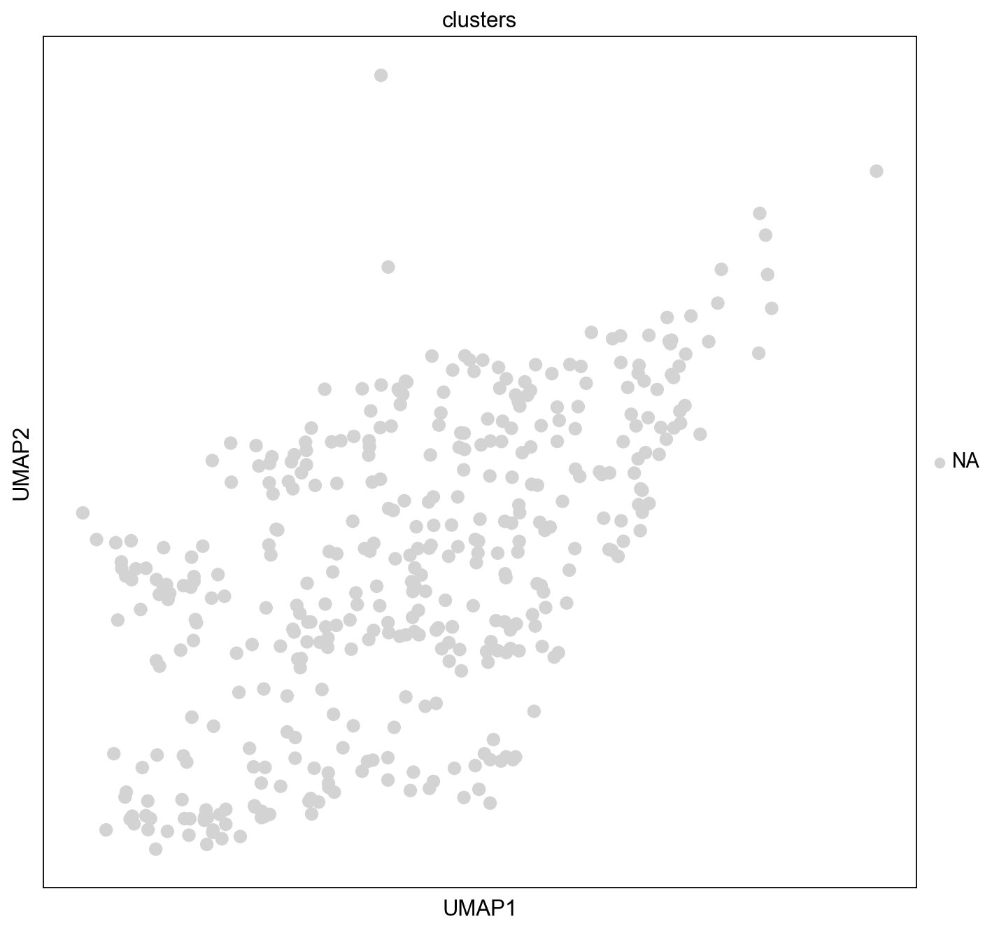

12


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


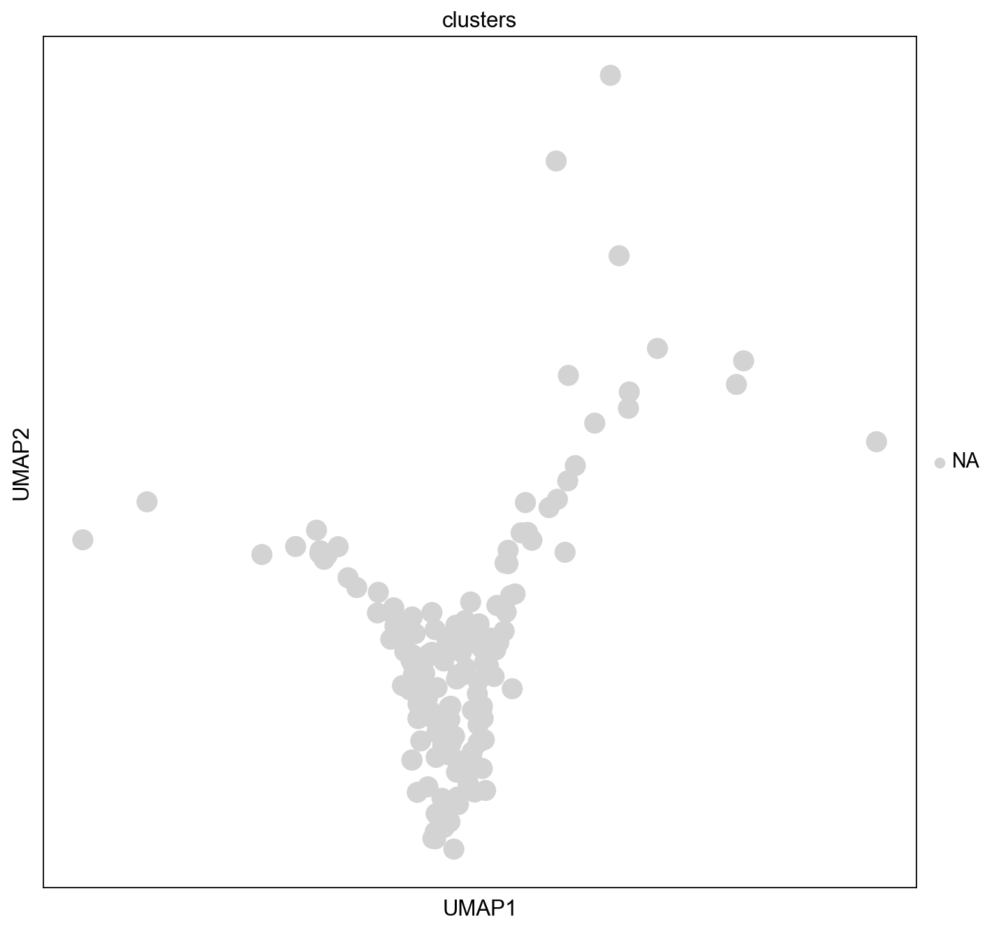

In [186]:
# for each louvain cluster, plot the cell type distribution
for i in adata_concat.obs.louvain.cat.categories:
    print(i)
    try:
        sc.pl.umap(adata_concat[adata_concat.obs.louvain == i], color=['clusters'])
        
    except:
        pass
    


In [20]:
# cell_type_2 is based on louvain: cluster 0 = endothelial, cluster 1 = Stem Cells (Mesenchymal), Cluster 2 = Oligodendyrocye-like, Cluster 6 = Astrocyte-like, Cluster 7 = Stem Cells (Mesenchymal, Proneural Mix), Cluster 8 = Stem Cells (Mesenchymal, Proneural Mix)
# for all louvain cluster 0, set cell_type_2 to be Endothelial
adata_concat.obs.loc[adata_concat.obs.louvain == '0', 'cell_type_2'] = 'Endothelial'

# for all louvain cluster 1, set cell_type_2 to be Stem Cells (Mesenchymal)
adata_concat.obs.loc[adata_concat.obs.louvain == '1', 'cell_type_2'] = 'Stem Cells (Mesenchymal)'

# for all louvain cluster 2, set cell_type_2 to be Oligodendyrocye-like
adata_concat.obs.loc[adata_concat.obs.louvain == '2', 'cell_type_2'] = 'Oligodendyrocye-like'

# for all louvain cluster 6, set cell_type_2 to be Astrocyte-like
adata_concat.obs.loc[adata_concat.obs.louvain == '6', 'cell_type_2'] = 'Astrocyte-like'

# for all louvain cluster 7, set cell_type_2 to be Stem Cells (Mesenchymal, Proneural Mix)
adata_concat.obs.loc[adata_concat.obs.louvain == '7', 'cell_type_2'] = 'Stem Cells (Mesenchymal, Proneural Mix)'

# for all louvain cluster 8, set cell_type_2 to be Stem Cells (Mesenchymal, Proneural Mix)
adata_concat.obs.loc[adata_concat.obs.louvain == '8', 'cell_type_2'] = 'Stem Cells (Mesenchymal, Proneural Mix)'


In [241]:
# cell_type_2 is based on louvain: cluster 0 = endothelial, cluster 1 = Stem Cells (Mesenchymal), Cluster 2 = Oligodendyrocye-like, Cluster 6 = Astrocyte-like, Cluster 7 = Stem Cells (Mesenchymal, Proneural Mix), Cluster 8 = Stem Cells (Mesenchymal, Proneural Mix)
# for all louvain cluster 0, set cell_type_2 to be Endothelial
# drop cell_type_3
adata_concat.obs.drop(columns=['cell_type_3'], inplace=True)
adata_concat.obs.loc[adata_concat.obs.clusters == '2', 'cell_type_3'] = 'Maturing Mesenchymal'
adata_concat.obs.loc[adata_concat.obs.clusters == '3', 'cell_type_3'] = 'Mesenchymal/Proneural Mix (70/30)'
adata_concat.obs.loc[adata_concat.obs.clusters == '4', 'cell_type_3'] = 'Mesenchymal'
adata_concat.obs.loc[adata_concat.obs.clusters == '7', 'cell_type_3'] = 'Mesenchymal/Proneural Mix (80/20)'
adata_concat.obs.loc[adata_concat.obs.clusters == '26', 'cell_type_3'] = 'Stem Cells/Mesenchymal/Pron Mix'
adata_concat.obs.loc[adata_concat.obs.clusters == '1', 'cell_type_3'] = 'Oligodendorcyte'
adata_concat.obs.loc[adata_concat.obs.clusters == '0', 'cell_type_3'] = 'Endothelial'
adata_concat.obs.loc[adata_concat.obs.clusters == '48', 'cell_type_3'] = 'Proneural'
adata_concat.obs.loc[adata_concat.obs.clusters == '5', 'cell_type_3'] = 'Astrocyte-like'

# for everything that is not na, but does have a cell type in cell_type, set cell_type_3 to be the same as cell_type
# for everything that does not have a cell type in cell_type, and does not have a cell_type_3 set to be rat_endothelial
adata_concat.obs.loc[adata_concat.obs.cell_type_3.isna() & adata_concat.obs.cell_type.isna(), 'cell_type_3'] = 'Rat Endothelial'

# adata_concat.obs.loc[adata_concat.obs.cell_type_3.isna() & adata_concat.obs.cell_type.notna(), 'cell_type_3'] = adata_concat.obs.cell_type

















In [108]:
adata_concat.obs

,cell_type,batch,louvain,sample_type,cell_type_2
AAACCCAAGAAGGTAG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,Stem Cells (Mesenchymal)
AAACCCAAGACCTCCG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,Stem Cells (Mesenchymal)
AAACCCACAACTTGGT-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,Stem Cells (Mesenchymal)
AAACCCAGTCTACGAT-1-SF10022-ref,Oligodendrocyte,ref,2,NaN,Oligodendyrocye-like
AAACCCAGTTATCTTC-1-SF10022-ref,Neoplastic_cell/mesenchymal,ref,1,NaN,Stem Cells (Mesenchymal)
...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,Endothelial


running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:04)
--> added 'pos', the PAGA positions (adata.uns['paga'])


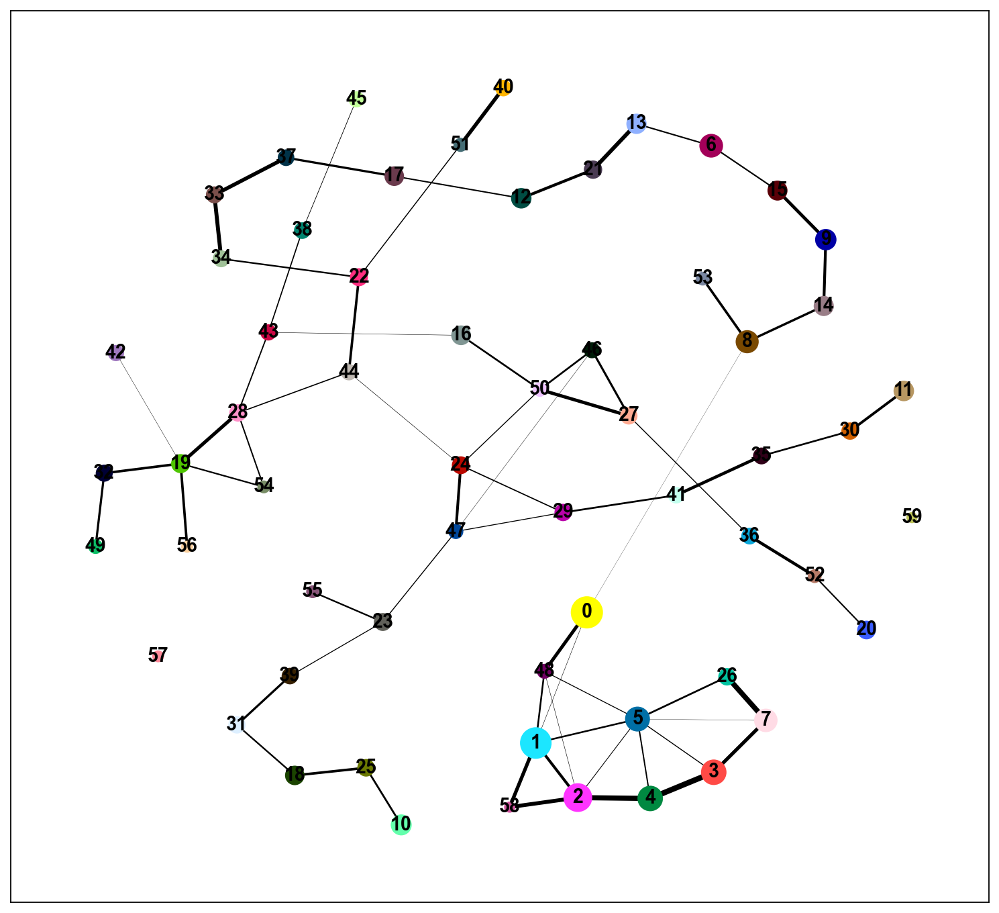

In [187]:
sc.tl.paga(adata_total, groups='clusters')
sc.pl.paga(adata_total, color=['clusters'])

<AxesSubplot: >

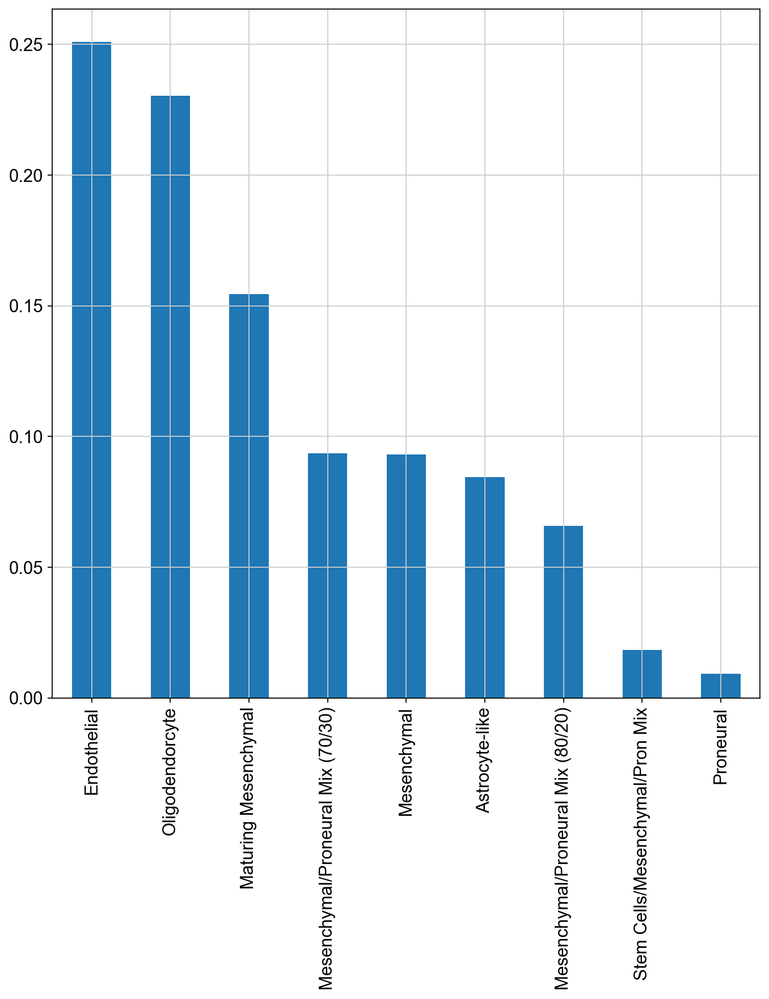

In [247]:
# save cell_type count and plot as histogram

# adata_concat.obs.cell_type_3.value_counts().plot(kind='bar')

# remove rat endothelial and make each value as a fraction of the whole
# adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').plot(kind='bar')

# do each cell type as a percentage
adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').apply(lambda x: x/adata_concat.obs.cell_type_3.value_counts().drop('Rat Endothelial').sum()).plot(kind='bar')


<AxesSubplot: >

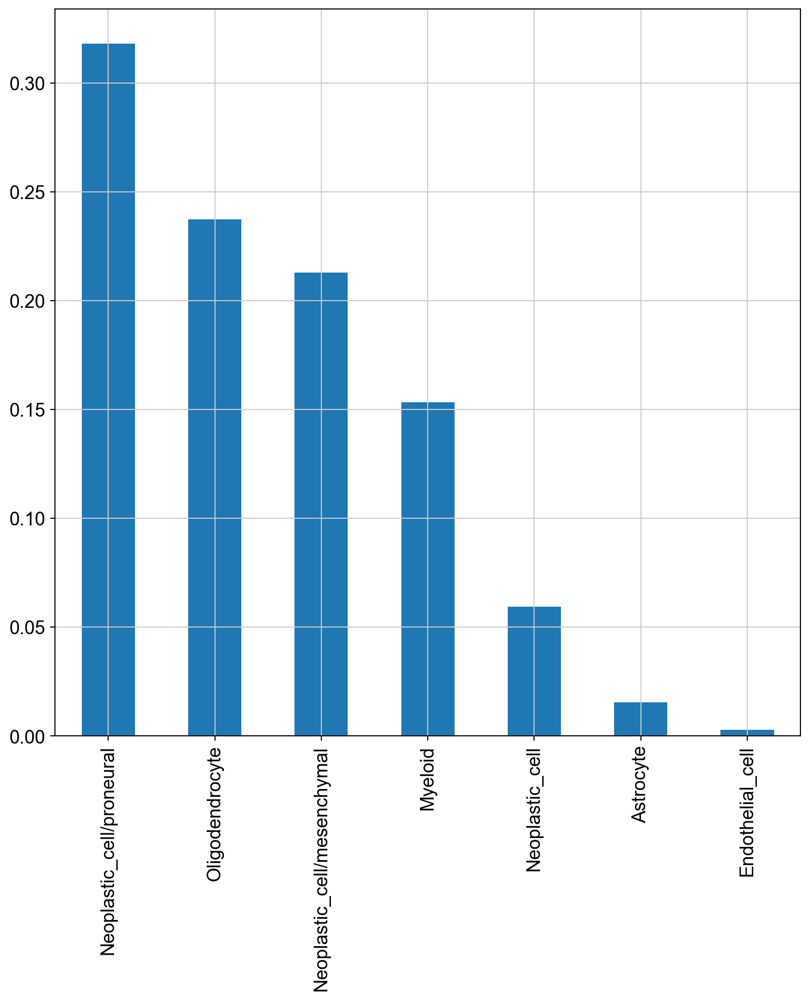

In [248]:
adata_concat.obs.cell_type.value_counts().apply(lambda x: x/adata_concat.obs.cell_type.value_counts().sum()).plot(kind='bar')


In [255]:
import seaborn as sns
# using adata_total make a full heatmap with genes according to gene_type_3
sns.heatmap(adata_total, cmap='viridis')


KeyboardInterrupt: 

In [200]:
sc.tl.draw_graph(adata_total, init_pos='paga')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:20:16)


/Users/shaunregenbaum/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


KeyError: 'Could not find key cell_type_3 in .var_names or .obs.columns.'

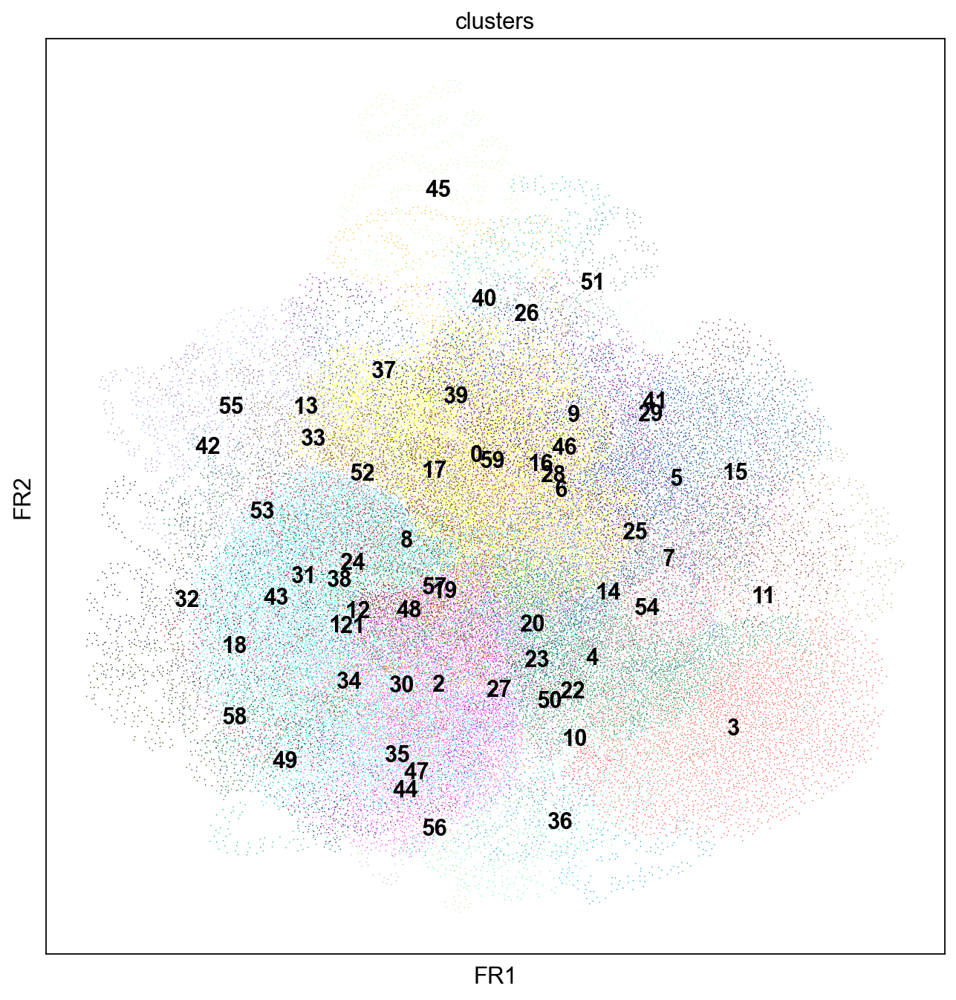

In [207]:
sc.pl.draw_graph(adata_total, color=['clusters','cell_type_3'], legend_loc='on data', layout='fr')


In [4]:
adata_total.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '48')[0]
sc.tl.dpt(adata_total)
sc.pl.draw_graph(adata_total, color=['dpt_pseudotime'])



In [42]:
import celltypist


In [58]:

# normalize data
sc.pp.normalize_total(adata_ref_combined, target_sum=1e4)
sc.pp.log1p(adata_ref_combined)

normalizing counts per cell
    finished (0:00:00)


In [59]:
import time
t_start = time.time()
model_fs = celltypist.train(adata_ref_combined, 'cell_type', n_jobs = 10, max_iter = 5, use_SGD = True)
t_end = time.time()
print(f"Time elapsed: {t_end - t_start} seconds")


🍳 Preparing data before training
✂️ 4636 non-expressed genes are filtered out
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
✅ Model training done!


Time elapsed: 22.58592200279236 seconds


In [115]:
model_fs.write('write/model_fs.pkl')

In [60]:
gene_index = np.argpartition(np.abs(model_fs.classifier.coef_), -1000, axis = 1)[:, -1000:]
gene_index = np.unique(gene_index)
print(f"Number of genes selected: {len(gene_index)}")

Number of genes selected: 5778


In [129]:
t_start = time.time()
model = celltypist.train(adata_ref_combined[:,gene_index], 'cell_type', check_expression = False, n_jobs = 10, max_iter = 100, balance_cell_type=True, use_SGD = True)
t_end = time.time()
print(f"Time elapsed: {t_end - t_start} seconds")

🍳 Preparing data before training
✂️ 758 non-expressed genes are filtered out
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
✅ Model training done!


Time elapsed: 14.537906885147095 seconds


In [137]:
model.write('models/snseq_glio.pkl')
adata_total =sc.read_h5ad('write/total_combined.h5ad')

In [46]:
sc.pp.normalize_per_cell(adata_total)
sc.pp.log1p(adata_total)
model = 'models/snseq_glio.pkl'

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [61]:
predictions = celltypist.annotate(adata_total[:,gene_index], model, majority_voting=True)

IndexError: positional indexers are out-of-bounds

In [53]:
predictions.predicted_labels
adata_predict = predictions.to_adata()  

In [54]:
sc.pp.neighbors(adata_predict)
sc.tl.umap(adata_predict)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


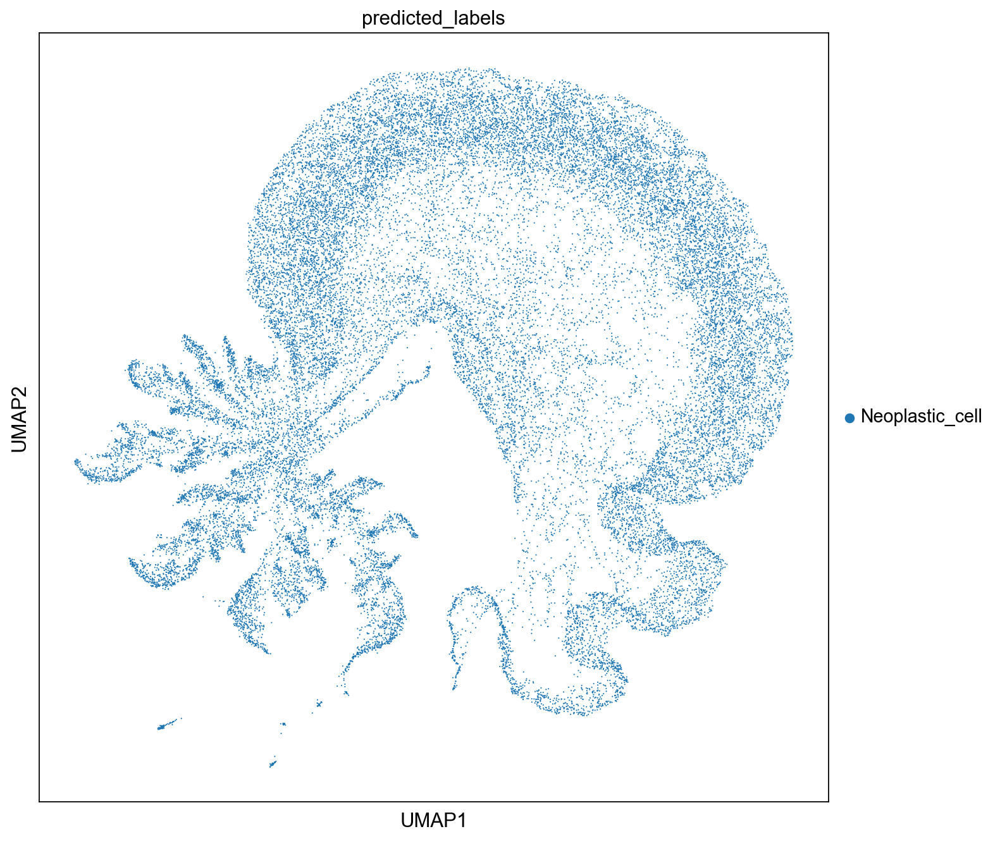

In [55]:
sc.pl.umap(adata_predict, color=['predicted_labels'], wspace = 0.5)

In [200]:
# Group the files in the directory /Volumes/Extreme_SSD/snRNA  that contain the same prefix, before matrix/features/barcodes into folders using the array below:

import os 
import shutil

# create a list of all the files in the directory
files = os.listdir('/Volumes/Extreme_SSD/snRNA/')

# create a list of all the prefixes, which end after the third underscore
prefixes = [file.split('_')[0:3] for file in files]

# group the files by prefix
prefixes = [prefix[0] + '_' + prefix[1] + '_' + prefix[2] for prefix in prefixes]

# remove everything without a . in front of it
prefixes = [prefix for prefix in prefixes if prefix[0] == '.']

# // remove first two characters
prefixes = [prefix[2:] for prefix in prefixes]

prefixes

# remove all files that have ._ in front of them in files array
files = [file for file in files if file[0:2] != '._']

# deduplicate files array
files = list(set(files))

for prefix in prefixes:
    try:
        os.makedirs('/Volumes/Extreme_SSD/snRNA/' + prefix)
    except:
        print('folder already exists')
    for file in files:
        if prefix in file:
            try:
                shutil.move('/Volumes/Extreme_SSD/snRNA/' + file, '/Volumes/Extreme_SSD/snRNA/' + prefix + '/' + file)
            except:
                print('file already moved')


